<a href="https://colab.research.google.com/github/SofiaFreiman/Erythropoiesis/blob/main/GSE181989_load_QC_PP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scanpy leidenalg scikit-misc scvi-tools gprofiler-official pybiomart bbknn celltypist decoupler omnipath scrublet harmonypy
import os
os.kill(os.getpid(), 9)

In [ ]:
import os
os.kill(os.getpid(), 9)

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import time
import os
import pandas as pd
import numpy as np
import scipy.stats
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy.external as sce
import anndata
import celltypist
from celltypist import models
import scvi

sc.settings.verbosity = 1
sns.set(font_scale = 1)
sns.set_style("whitegrid")

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

## Foo

In [ ]:
def qc(adata):
  fig, axs = plt.subplots(ncols = 7, nrows = 1, figsize = (25, 2), layout = "constrained")

  sns.distplot(adata.obs['total_counts'], kde = False, ax = axs[0], hist_kws={"alpha":1}, color = 'g')
  axs[0].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[0].set_ylabel('n cells', fontsize = 10);
  axs[0].set_xlim(0, 80000);
  axs[0].xaxis.set_major_locator(plt.MaxNLocator(5))

  sns.distplot(adata.obs['n_genes_by_counts'], kde = False, ax = axs[1], hist_kws={"alpha":1}, color = 'b')
  axs[1].set_xlabel("n genes per cell", fontsize = 10); axs[1].set_ylabel('n cells', fontsize = 10);

  sns.scatterplot(y = adata.obs["n_genes_by_counts"], x = adata.obs["total_counts"], ax=axs[2], s = 3, color = 'goldenrod')
  axs[2].set_xlabel("n UMI per cell (total counts)", fontsize = 10); axs[2].set_ylabel("n genes per cell", fontsize = 10)
  axs[2].xaxis.set_major_locator(plt.MaxNLocator(5))

  variances = np.var(adata.X.A, axis=0)
  means = adata.X.mean(axis=0).A[0][variances > 0]
  variances = variances[variances > 0]
  sns.scatterplot(x = means, y = variances, ax=axs[3], s = 3)
  axs[3].set_xscale("log"); axs[3].set_yscale("log")

  sns.distplot(adata.obs["pct_counts_mt"], kde = False, ax = axs[4], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[4].set_xlabel("% of mt expression", fontsize = 10); axs[4].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_ribo"], kde = False, ax = axs[5], hist_kws={"alpha":1}, color = 'firebrick', bins = 100)
  axs[5].set_xlabel("% of ribo expression", fontsize = 10); axs[5].set_ylabel('n cells', fontsize = 10)

  sns.distplot(adata.obs["pct_counts_hb"], kde = False, ax = axs[6], hist_kws={"alpha":1}, color = 'firebrick')
  axs[6].set_xlabel("% of hb expression", fontsize = 10); axs[6].set_ylabel('n cells', fontsize = 10)

In [ ]:
from scipy.stats import median_abs_deviation

def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M)
    return outlier

## Aplastic Anemia GSE181989
2 healthy, 2 aplastic anemia donors \
Bone marrow; CD34+ cells purified and mixed with other BM mononuclear at 1:4 ratio \
10×Genomics, Illumina NovaSeq 6000 \
https://explore.data.humancellatlas.org/projects/e993adcd-d4ba-4f88-9a05-d1c05bdf0c45 \
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE181989 \
https://www.frontiersin.org/journals/genetics/articles/10.3389/fgene.2021.745483/full

### Load & annotate

In [ ]:
!ls drive/MyDrive/LU/Erythropoiesis/GSE181989

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


GSE181989_celltyping_results.txt  GSM5515743_Normal1_barcodes.tsv.gz
GSM5515741_AA1_barcodes.tsv.gz	  GSM5515743_Normal1_features.tsv.gz
GSM5515741_AA1_features.tsv.gz	  GSM5515743_Normal1_matrix.mtx.gz
GSM5515741_AA1_matrix.mtx.gz	  GSM5515744_Normal2_barcodes.tsv.gz
GSM5515742_AA2_barcodes.tsv.gz	  GSM5515744_Normal2_features.tsv.gz
GSM5515742_AA2_features.tsv.gz	  GSM5515744_Normal2_matrix.mtx.gz
GSM5515742_AA2_matrix.mtx.gz


#### Load

In [ ]:
prefix_ls = []
for i in os.listdir(path + "GSE181989"):
  if "barcodes" in i:
    prefix_ls.append(i.split("barcodes")[0])
prefix_ls

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['GSM5515744_Normal2_',
 'GSM5515741_AA1_',
 'GSM5515742_AA2_',
 'GSM5515743_Normal1_']

In [ ]:
adata_ls = []
for i in prefix_ls:
  adata = sc.read_10x_mtx(path + "GSE181989", prefix = i, cache=True)
  donor = i.split("_")[1]
  adata.uns["name"] = donor
  adata.obs["donor"] = donor
  adata.obs['dataset'] = "GSE181989"
  adata_ls.append(adata)

for n, data in enumerate(adata_ls):
  donor = adata_ls[n].uns["name"]
  print(donor)
  adata_ls[n].obs.index = [ind.split("-")[0] for ind in adata_ls[n].obs.index]
  adata_ls[n].obs.index = [ind + "_" + donor for ind in adata_ls[n].obs.index]
  adata_ls[n].obs['state'] = adata_ls[n].obs['donor'].replace({"Normal1" : "healthy", 'Normal2' : "healthy", "AA1" : "AA", "AA2" : "AA"})

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Normal2
AA1
AA2
Normal1


In [ ]:
df = pd.read_csv(path + "GSE181989/GSE181989_celltyping_results.txt", sep = "\t", index_col = 0)

df["sampleid"] = pd.Categorical(df["sampleid"])
df_ls = []
for i in df["sampleid"].cat.categories:
  df_sample = df[df["sampleid"] == i]
  df_ls.append(df_sample)

for n, data in enumerate(df_ls):
  donor = list(set(df_ls[n]["sampleid"]))[0]
  df_ls[n].index = [ind.split("_")[1] for ind in df_ls[n].index]
  df_ls[n].index = [ind + "_" + donor for ind in df_ls[n].index]

#### Annotate

##### Celltypist

In [ ]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
model_fine = models.Model.load(model="Immune_All_Low.pkl")
model_coarse = models.Model.load(model="Immune_All_High.pkl")

In [ ]:
for n, i in enumerate(adata_ls):
  adata_ls[n].layers["counts"] = adata_ls[n].X.copy()
  sc.pp.normalize_total(adata_ls[n], target_sum=1e4)
  sc.pp.log1p(adata_ls[n])
  sc.pp.highly_variable_genes(adata_ls[n], n_top_genes=3000, layer="counts", flavor="seurat_v3")
  sc.pp.pca(adata_ls[n], use_highly_variable = True)
  sc.pp.neighbors(adata_ls[n])
  sc.tl.umap(adata_ls[n])

In [ ]:
for n, i in enumerate(adata_ls):
  predictions = celltypist.annotate(adata_ls[n], model=model_coarse, majority_voting=True)
  pred_adata = predictions.to_adata()
  adata_ls[n].obs["celltypist_pred_coarse_labels"]  = pred_adata.obs["predicted_labels"]
  adata_ls[n].obs["celltypist_pred_coarse_voting"] = pred_adata.obs["majority_voting"]
  adata_ls[n].obs["celltypist_pred_coarse_conf_score"] = pred_adata.obs["conf_score"]

annotated_fine_adata_ls = []
for n, i in enumerate(adata_ls):
  predictions = celltypist.annotate(adata_ls[n], model=model_fine, majority_voting=True)
  pred_adata = predictions.to_adata()
  adata_ls[n].obs["celltypist_pred_fine_labels"]  = pred_adata.obs["predicted_labels"]
  adata_ls[n].obs["celltypist_pred_fine_voting"] = pred_adata.obs["majority_voting"]
  adata_ls[n].obs["celltypist_pred_fine_conf_score"] = pred_adata.obs["conf_score"]

In [ ]:
for n, i in enumerate(adata_ls):
  adata_ls[n].X = adata_ls[n].layers["counts"].copy()

##### Azimuth

In [ ]:
az_ls = []
for i in os.listdir("drive/MyDrive/LU/Erythropoiesis/GSE181989"):
  if "azimuth_pred" in i:
    donor = i.split("_")[0]
    az = pd.read_csv(path + "GSE181989/" + i, sep = "\t", index_col = 0)
    az.index = [ind.split("-")[0] for ind in az.index]
    az.index = [ind + "_" + donor for ind in az.index]
    az_ls.append(az)

In [ ]:
azimuth = pd.concat(az_ls)
print(len(azimuth))
azimuth[:2]

23685


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,predicted.celltype.l2,predicted.celltype.l1,predicted.celltype.l2.score,predicted.celltype.l1.score,mapping.score
AAACCTGAGACACTAA_AA1,Late Eryth,HSPC,1.000000,1.000000,0.983406
AAACCTGAGGCAGGTT_AA1,Late Eryth,HSPC,0.988713,0.988713,0.431651


### Concat

In [ ]:
adata = sc.concat(adata_ls)
adata

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


AnnData object with n_obs × n_vars = 23685 × 33538
    obs: 'donor', 'dataset', 'state', 'predicted_labels', 'majority_voting', 'conf_score', 'celltypist_pred_coarse_labels', 'celltypist_pred_coarse_voting', 'celltypist_pred_coarse_conf_score', 'over_clustering', 'celltypist_pred_fine_labels', 'celltypist_pred_fine_voting', 'celltypist_pred_fine_conf_score'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [ ]:
df = pd.concat(df_ls)
df[:2]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,celltype,sampleid,group,clusters
AAACCTGAGACACTAA_AA1,Erythrocytes,AA1,AA,9
AAACCTGAGGCAGGTT_AA1,Erythrocytes,AA1,AA,6


In [ ]:
adata.obs['cell_type_paper'] = df['celltype']
adata.obs['cell_type_azimuth_l1'] = azimuth['predicted.celltype.l1']
adata.obs['cell_type_azimuth_l1_score'] = azimuth['predicted.celltype.l1.score']
adata.obs['cell_type_azimuth_l2'] = azimuth['predicted.celltype.l2']
adata.obs['cell_type_azimuth_l2_score'] = azimuth['predicted.celltype.l2.score']
adata.obs[:2]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,donor,dataset,state,predicted_labels,majority_voting,conf_score,celltypist_pred_coarse_labels,celltypist_pred_coarse_voting,celltypist_pred_coarse_conf_score,over_clustering,celltypist_pred_fine_labels,celltypist_pred_fine_voting,celltypist_pred_fine_conf_score,cell_type_paper,cell_type_azimuth_l1,cell_type_azimuth_l1_score,cell_type_azimuth_l2,cell_type_azimuth_l2_score
AAACCTGAGCGTGAAC_Normal2,Normal2,GSE181989,healthy,Naive B cells,Tcm/Naive helper T cells,0.751586,B cells,HSC/MPP,0.826794,15,Naive B cells,Tcm/Naive helper T cells,0.751586,HSC,HSPC,1.000000,EMP,0.467258
AAACCTGAGGCCCTTG_Normal2,Normal2,GSE181989,healthy,Proliferative germinal center B cells,pDC,0.013570,B cells,pDC,0.001594,25,Proliferative germinal center B cells,pDC,0.013570,HSC,HSPC,0.947595,CLP,0.316799


### QC

In [ ]:
adata.X = adata.layers["counts"].copy()
print(adata.X.max())

27295.0


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['ribo'] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo', 'hb'], percent_top=[20], log1p=True, inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


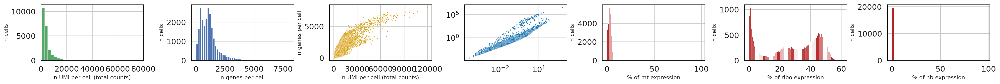

In [ ]:
qc(adata)

In [ ]:
adata.obs["outlier"] = (
    (is_outlier(adata, "log1p_total_counts", 5))
    | (is_outlier(adata, "log1p_n_genes_by_counts", 5))
    # | (is_outlier(adata, "pct_counts_in_top_20_genes", 5))
    | (is_outlier(adata, "pct_counts_mt", 3))
    | (adata.obs["pct_counts_mt"] > 10)
)

adata.obs.outlier.value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
outlier,
False,21473
True,2212


In [ ]:
sce.pp.scrublet(adata)
adata.obs['predicted_doublet'].replace({False : "singlet", True : "doublet"}, inplace = True)
print(adata.obs['predicted_doublet'].value_counts())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


predicted_doublet
singlet    23685
Name: count, dtype: int64


In [ ]:
adata.X.max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


27295.0

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers['lognorm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=4000, layer="counts", flavor="seurat_v3", batch_key="donor")
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='donor')
sc.tl.umap(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


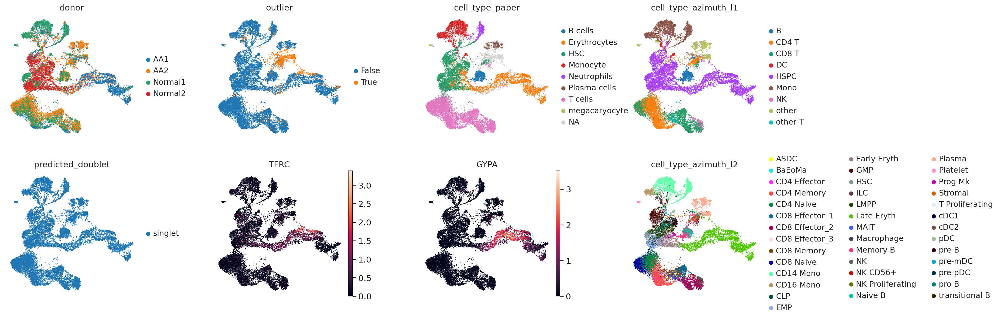

In [ ]:
sc.pl.umap(adata, color = ["donor", 'outlier', 'cell_type_paper', 'cell_type_azimuth_l1', 'predicted_doublet', "TFRC", "GYPA", 'cell_type_azimuth_l2'], wspace=0.4, ncols = 4)

In [ ]:
print(adata.shape)
adata = adata[~adata.obs["outlier"]]
print(adata.shape)
adata = adata[adata.obs['predicted_doublet'] == 'singlet']
print(adata.shape)

(23685, 33538)
(21473, 33538)
(21473, 33538)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


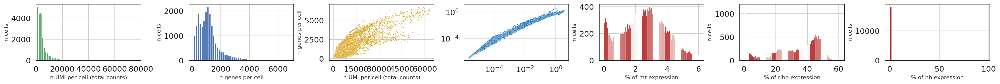

In [ ]:
qc(adata)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


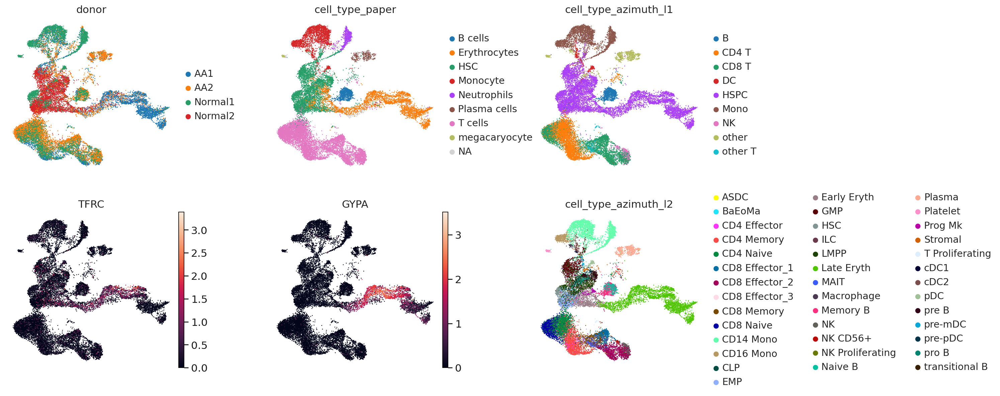

In [ ]:
sc.pl.umap(adata, color = ["donor", 'cell_type_paper', 'cell_type_azimuth_l1', "TFRC", "GYPA", 'cell_type_azimuth_l2'], wspace=0.4, ncols = 3)

### Manual annotation

In [ ]:
print(adata.X.max())
adata.X = adata.layers['lognorm'].copy()
print(adata.layers["counts"].max())
print(adata.X.max())
print(adata.layers["lognorm"].max())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


7.9576755
27295.0
7.9576755
7.9576755


In [ ]:
# adata.X = adata.layers["counts"].copy()
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)
# adata.layers['lognorm'] = adata.X.copy()
sc.pp.highly_variable_genes(adata, n_top_genes=4000, layer="counts", flavor="seurat_v3", batch_key="donor")
sc.pp.pca(adata, use_highly_variable = True)
sce.pp.bbknn(adata, batch_key='donor')
# sce.pp.harmony_integrate(adata, key = "donor", basis='X_pca', adjusted_basis='X_pca_harmony')
# sc.pp.neighbors(adata, use_rep = 'X_pca_harmony')
sc.tl.umap(adata, min_dist = 0.6, random_state = 1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


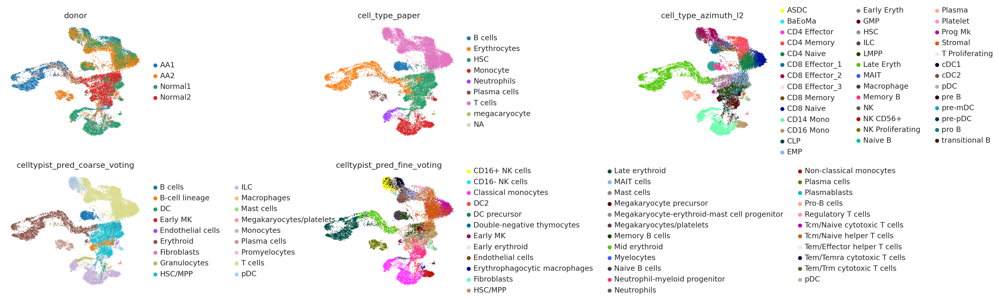

In [ ]:
sc.pl.umap(adata, color = ["donor", 'cell_type_paper', 'cell_type_azimuth_l2',
                           'celltypist_pred_coarse_voting', 'celltypist_pred_fine_voting'], wspace=1, ncols = 3)

In [ ]:
sc.pl.umap(adata, color = ["CD34", "FLT3", "TFRC", "GYPA", "GATA1", "GATA2", "RUNX1", "HBB"], wspace=0.4, ncols = 5, vmin = 0,)

In [ ]:
markers = dict(
  Tcell = ['CD3D','TRAC','CD8A','CD4','CXCR4'] + ['BTG1'],
  Mac = ['TYROBP','FCER1G','CD14','S100A8','S100A9','LYZ'],
  Bcell = ['CD27','CD74','CD79B','IGKC','IGHM','MZB1'],
  DC = ['PLD4','ITM2C','JCHAIN','CD40','PLIN2','LGALS3BP'],
  NK = ['GNLY','NKG7','PRF1','KLRB1','GZMA', 'CTSW'],
  Neu = ['PRSS57','SMIM24','ELANE','AZU1','PRTN3','CFD'],
  Ery = ['HBA1','CA1','SLC4A1','GYPA','TFRC','HMGA1'],
  Meg = ['CD9', 'LOX', 'VWF', 'NFIB', 'TGFB1', 'FLI1'],
  Mast = ['CCL2', 'CREB3L1', 'GNAI1', 'PLAU', 'KCNE3', 'SRGN'],
  MPP = ['KIT', 'CCL2', 'GATA2', 'GATA4', 'RUNX1', 'TRIM33'],
  CLP = ['SPINK2', 'CD79A','EBF1','IGHM'], #'DNTT',
  Mito = ['MT-ND1','MT-ND3','MT-ND4','MT-CO2','MT-CYB'],
  Hb = ['HBA1','HBA2','HBB','HBG1','HBG2','HBD','HBE1','HBZ']
  )

adata.uns['markers'] = markers

for i in adata.uns['markers'].keys():
  sc.tl.score_genes(adata, adata.uns['markers'][i], score_name=i)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


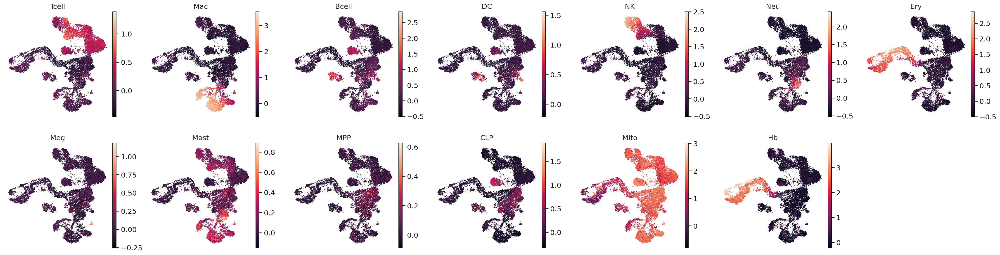

In [ ]:
sc.pl.umap(adata, color = markers, ncols = 7)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


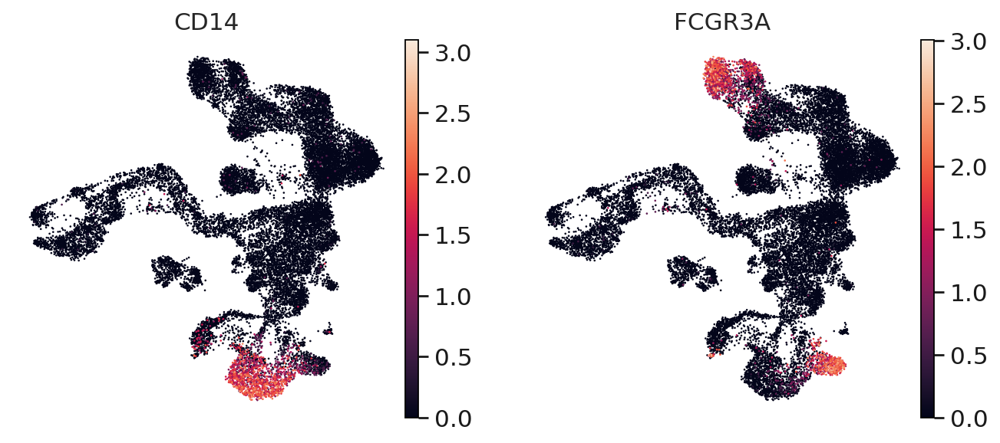

In [ ]:
sc.pl.umap(adata, color = ["CD14", "FCGR3A"])

In [ ]:
for i in [0.5, 1, 1.5, 2]:
  print(i)
  sc.tl.leiden(adata, resolution = i, key_added = "leiden_res_" + str(i))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.5
1
1.5
2


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


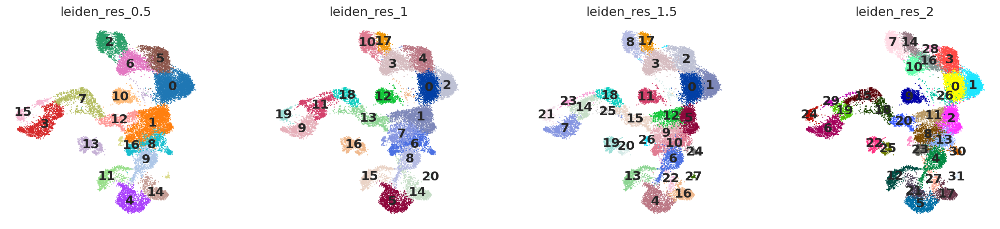

In [ ]:
sc.pl.umap(adata, color = [i for i in adata.obs.columns if "leiden_res" in i], legend_loc = 'on data')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Axes: title={'center': 'donor'}, xlabel='UMAP1', ylabel='UMAP2'>

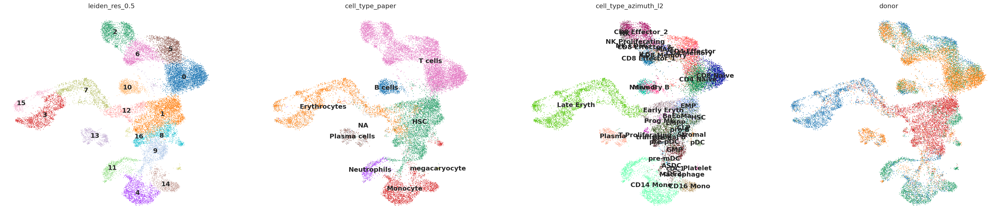

In [ ]:
fig, axs = plt.subplots(ncols = 4, nrows = 1, figsize = (38, 8), )
sc.pl.umap(adata, color = ['leiden_res_0.5', ], ax = axs[0], legend_loc = 'on data', show = False)
sc.pl.umap(adata, color = ['cell_type_paper',], ax = axs[1], legend_loc = 'on data', show = False)
sc.pl.umap(adata, color = ["cell_type_azimuth_l2"], ax = axs[2], legend_loc = 'on data', show = False)
sc.pl.umap(adata, color = ["donor"], ax = axs[3], legend_loc = None, show = False,)

In [ ]:
## Annotation based on leiden-0.5
leiden_to_ct = {
    "0" : "T cells", "2" : "T cells", "5" : "T cells", "6" : "T cells",
    "10" : "B cells",
    "13" : "Plasma cells",
    "1" : "HSCs/LMPPs", "8" : "HSCs/LMPPs", "9" : "HSCs/LMPPs", "16" : "HSCs/LMPPs",
    "4" : "Monocytes CD14", "14" : "Monocytes CD16",
    "11" : "Neuthrophils",
    "12" : 'Erythroid precursors',
    "7" : "Erythroid cells",
    "3" : "Reticulocytes", "15" : "Reticulocytes",
    }
adata.obs['anno'] = [leiden_to_ct[i] for i in adata.obs["leiden_res_0.5"]]
adata.obs['anno'] = adata.obs['anno'].astype("category")
adata.obs['anno'] = adata.obs['anno'].cat.add_categories(["Megacaryocytes", "EMPs"])
## Fine correction
for i in adata.obs.index:
  for k in ['20']:
    if adata.obs.loc[i, 'leiden_res_1'] == k:
      adata.obs.loc[i, 'anno'] = "Megacaryocytes"
for i in adata.obs.index:
  for k in ['12']:
    if adata.obs.loc[i, 'leiden_res_1.5'] == k:
      adata.obs.loc[i, 'anno'] = "EMPs"

print(set(adata.obs['anno']))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'Plasma cells', 'Erythroid precursors', 'Reticulocytes', 'Megacaryocytes', 'HSCs/LMPPs', 'EMPs', 'Monocytes CD16', 'B cells', 'Monocytes CD14', 'T cells', 'Erythroid cells', 'Neuthrophils'}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


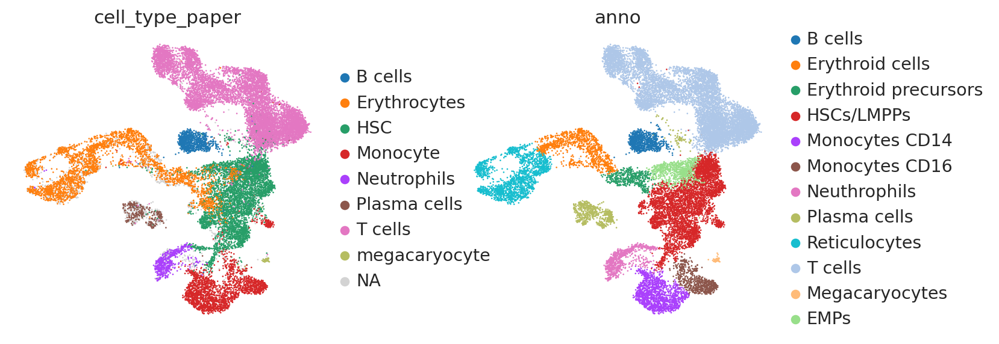

In [ ]:
sc.pl.umap(adata, color = ['cell_type_paper', 'anno'], wspace = 0.3)

In [ ]:
pd.crosstab(adata.obs['donor'], adata.obs['anno'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


anno,B cells,Erythroid cells,Erythroid precursors,HSCs/LMPPs,Monocytes CD14,Monocytes CD16,Neuthrophils,Plasma cells,Reticulocytes,T cells,Megacaryocytes,EMPs
donor,,,,,,,,,,,,
AA1,171,769,62,238,493,149,147,96,1738,1387,0,1
AA2,477,157,80,313,126,80,77,538,57,5282,4,4
Normal1,220,4,13,568,804,389,523,14,31,1588,58,114
Normal2,5,188,332,3341,8,47,0,25,24,39,4,688


### Write

In [ ]:
adata.write(path + "AA.h5ad")